In [251]:
import requests
from io import StringIO
import pandas as pd
from os.path import exists
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LinearRegression
from sklearn.metrics import classification_report, plot_confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import auc, accuracy_score, confusion_matrix, mean_squared_error

from alibi.utils import gen_category_map
from alibi.explainers import AnchorTabular

import statsmodels.api as sm
import lime
import lime.lime_tabular
import shap
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import XGBRegressor
import xgboost as xgb
from sklearn.metrics import mean_squared_error

from sklearn.preprocessing import StandardScaler

In [36]:
from aif360.datasets import GermanDataset
dataset_orig = GermanDataset(
    protected_attribute_names=['age'],           
    privileged_classes=[lambda x: x >= 25],      
    features_to_drop=['personal_status', 'sex']
)

dataset_orig_train, dataset_orig_test = dataset_orig.split([0.7], shuffle=True)

privileged_groups = [{'age': 1}]
unprivileged_groups = [{'age': 0}]


In [38]:
df = dataset_orig.convert_to_dataframe(set_category=False)[0]
# df.info()
original_df = df.copy()

In [464]:
attributes = ["Status", "Duration", "CreditHistory","Purpose", "CreditAmount", "Savings", "Employement",
              "InstallementDisposableIncome", "PersonalStatus", "Debtors","PresentResidence","Property", "Age",
              "Installment", "Housing","NoCredits","Job", "NoPplMaintenance", "Phone", "ForeignWorker",
              "Classification"]

qualitative_attributes = ["Status", "CreditHistory","Purpose", "Savings", "Employement", "PersonalStatus",
                          "Debtors","Property","Installment", "Housing","Job", "Phone", "ForeignWorker",
                          "Classification"]

qualitative_attributes_index = [i for i, e in enumerate(attributes) if e in set(qualitative_attributes)]


def load_data():
    URL = "https://archive.ics.uci.edu/ml/machine-learning-databases/statlog/german/german.data"
    response = requests.get(URL)
    file = open("data.txt", "wb")
    file.write(response.content)
    file.close()
    
    df=pd.read_table("data.txt", delim_whitespace=True, names=attributes, index_col=False)
    df.to_csv("data_raw.csv", index_label=False)
    
    return df

if exists("data_raw.csv"):
    data_df = pd.read_csv("data_raw.csv", index_col=None)
    print("Data loaded from csv")
else:
    data_df = load_data()
    print("Data loaded from web source")
    

person = data_df.iloc[100]
persontolist = person.to_list()
print(person, persontolist)

data_factorized = data_df.apply(lambda x : pd.factorize(x, sort=True)[0])
data_fac_labels = data_df.apply(lambda x : pd.factorize(x, sort=True)[1])
print(data_df.shape)

Data loaded from csv
Status                           A14
Duration                          24
CreditHistory                    A32
Purpose                          A40
CreditAmount                    1469
Savings                          A62
Employement                      A75
InstallementDisposableIncome       4
PersonalStatus                   A94
Debtors                         A101
PresentResidence                   4
Property                        A121
Age                               41
Installment                     A143
Housing                         A151
NoCredits                          1
Job                             A172
NoPplMaintenance                   1
Phone                           A191
ForeignWorker                   A201
Classification                     1
Name: 100, dtype: object ['A14', 24, 'A32', 'A40', 1469, 'A62', 'A75', 4, 'A94', 'A101', 4, 'A121', 41, 'A143', 'A151', 1, 'A172', 1, 'A191', 'A201', 1]
(1000, 21)


In [511]:
f = "Age"
faced = data_factorized[f].unique()
orig = data_df[f].unique()
print(list(zip(faced, orig)))


[(48, 67), (3, 22), (30, 49), (26, 45), (34, 53), (16, 35), (42, 61), (9, 28), (6, 25), (5, 24), (41, 60), (13, 32), (25, 44), (12, 31), (29, 48), (7, 26), (17, 36), (20, 39), (23, 42), (15, 34), (44, 63), (8, 27), (11, 30), (38, 57), (14, 33), (18, 37), (39, 58), (4, 23), (10, 29), (33, 52), (31, 50), (27, 46), (32, 51), (22, 41), (21, 40), (47, 66), (28, 47), (37, 56), (35, 54), (1, 20), (2, 21), (19, 38), (50, 70), (46, 65), (51, 74), (49, 68), (24, 43), (36, 55), (45, 64), (52, 75), (0, 19), (43, 62), (40, 59)]


In [512]:
# print(data_fac_labels)
feature_names = data_factorized.columns

print(feature_names)
f = "Job"
for f in feature_names:
    if len(data_factorized[f].unique()) < 150:
        print(f, data_factorized[f].unique())
        print(data_df[f].unique())
    else:
        print(f, "No unique")
# print(data_factorized[f])
# print(data_df[f])
person = data_factorized.iloc[112]
for d in person:
    print(d)

Index(['Status', 'Duration', 'CreditHistory', 'Purpose', 'CreditAmount',
       'Savings', 'Employement', 'InstallementDisposableIncome',
       'PersonalStatus', 'Debtors', 'PresentResidence', 'Property', 'Age',
       'Installment', 'Housing', 'NoCredits', 'Job', 'NoPplMaintenance',
       'Phone', 'ForeignWorker', 'Classification'],
      dtype='object')
Status [0 1 3 2]
['A11' 'A12' 'A14' 'A13']
Duration [ 2 29  8 26 17 23 21 11  5  6  3 31 13 27  7 19  4 30 14 10 22 15 12  0
 28  9 16 24 20  1 18 32 25]
[ 6 48 12 42 24 36 30 15  9 10  7 60 18 45 11 27  8 54 20 14 33 21 16  4
 47 13 22 39 28  5 26 72 40]
CreditHistory [4 2 3 0 1]
['A34' 'A32' 'A33' 'A30' 'A31']
Purpose [4 7 3 0 1 9 5 6 2 8]
['A43' 'A46' 'A42' 'A40' 'A41' 'A49' 'A44' 'A45' 'A410' 'A48']
CreditAmount No unique
Savings [4 0 2 3 1]
['A65' 'A61' 'A63' 'A64' 'A62']
Employement [4 2 3 0 1]
['A75' 'A73' 'A74' 'A71' 'A72']
InstallementDisposableIncome [3 1 2 0]
[4 2 3 1]
PersonalStatus [2 1 0 3]
['A93' 'A92' 'A91' 'A94']
De

In [471]:
divorced_male = data_df["PersonalStatus"]=="A91"
divorced_female = data_df["PersonalStatus"]=="A92"
single_male = data_df["PersonalStatus"]=="A93"
married_m = data_df["PersonalStatus"]=="A94"
single_f = data_df["PersonalStatus"]=="A95"

foreign = data_df["ForeignWorker"] == "A201"
native = data_df["ForeignWorker"] == "A202"

age1 = data_df["Age"] < 45

print(len(data_factorized[data_df["Age"] < 24]))


t1 = [divorced_male, divorced_female, single_male, single_f, married_m]
t2 = [foreign, native]
t3 = [age1]

print([str(t.sum()) for t in t1])
print([str(t.sum()) for t in t2])
print([str(t.sum()) for t in t3])

105
['50', '310', '548', '0', '92']
['963', '37']
['799']


In [470]:
filtered_data_df = data_factorized.copy()

# filtered_data_df = filtered_data_df.drop("PersonalStatus", axis=1)

In [452]:
to_factorized = filtered_data_df.copy()
data_factorized = to_factorized.apply(lambda x : pd.factorize(x)[0])

c = "Classification"
Y = data_factorized[c]
X = data_factorized.drop(c, axis=1)
# print(X["ForeignWorker"].describe())

In [453]:
# fig, ax = plt.subplots(figsize=(8.5,7))  
# sns.heatmap(data_factorized.corr(method="pearson"), ax=ax)
# plt.title("Attribute correlation in the dataset ")
# plt.plot()
# plt.show()

In [454]:
test_size = 0.1
X_train, X_test, Y_train, Y_test = train_test_split(X[:1000], Y[:1000],
                                                    test_size=test_size,
                                                    random_state = 42
                                                   )
print(X_train.shape)
print(X_test.shape)

(900, 20)
(100, 20)


In [455]:

print("bad credit:", (Y_train == 1).sum(), f"/{len(Y_train)}")
print("bad credit:", (Y_test == 1).sum(), f"/{len(Y_test)}")

bad credit: 271 /900
bad credit: 29 /100


# Fit a random forest classifier

Evaluation for Random Forest Model
              precision    recall  f1-score   support

           0       0.77      0.87      0.82        71
           1       0.53      0.34      0.42        29

    accuracy                           0.72       100
   macro avg       0.65      0.61      0.62       100
weighted avg       0.70      0.72      0.70       100



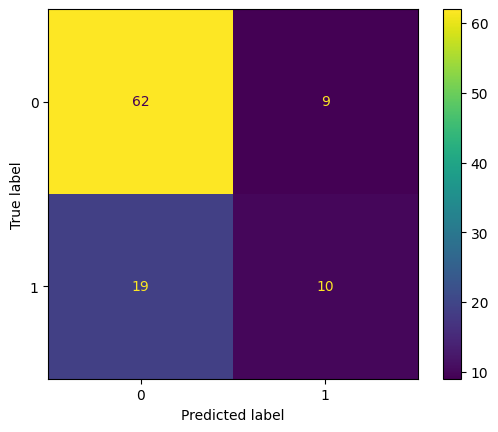

In [472]:
rfc = RandomForestClassifier(random_state=1, criterion="gini", max_depth=100, n_jobs=3, )
rfc.fit(X_train, Y_train)

y_pred = rfc.predict(X_test)
print(f"Evaluation for Random Forest Model")
print(classification_report(Y_test,y_pred))
plot_confusion_matrix(rfc, X_test, Y_test)
plt.show()


# Fist a Logistic regression model

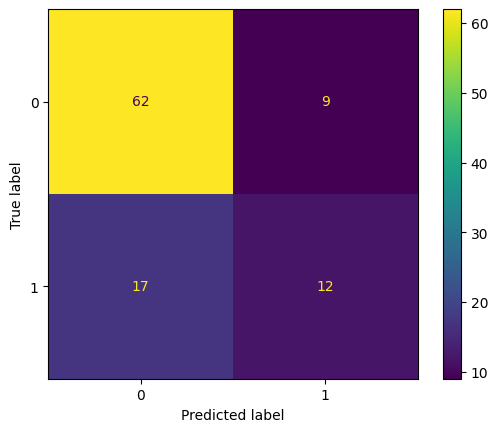

Stats for Logistic Regression
              precision    recall  f1-score   support

           0       0.78      0.87      0.83        71
           1       0.57      0.41      0.48        29

    accuracy                           0.74       100
   macro avg       0.68      0.64      0.65       100
weighted avg       0.72      0.74      0.73       100



In [473]:
logr = LogisticRegression(max_iter=100000)

logr_model = logr.fit(X_train, Y_train)
log_y_pred = logr_model.predict(X_test)
cr = classification_report(Y_test, log_y_pred)
cm = confusion_matrix(Y_test, log_y_pred)
plot_confusion_matrix(logr, X_test, Y_test)
plt.show()

print("Stats for Logistic Regression")
# print(cm)
print(cr)


# Fit a XGBoost classification model

In [519]:

xg_reg = xgb.XGBClassifier(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.5,
                max_depth = 5, alpha = 0, n_estimators = 10, )

xg_reg.fit(X_train,Y_train, eval_set=[(X_test, Y_test)])

xgb_y_pred = xg_reg.predict(X_test)
rmse = np.sqrt(mean_squared_error(Y_test, xgb_y_pred))

print("Stats for XGBoost Classifier")
print("RMSE: %f" % (rmse))
print(classification_report(Y_test, xgb_y_pred))
print(confusion_matrix(Y_test, xgb_y_pred))

[0]	validation_0-logloss:0.57272
[1]	validation_0-logloss:0.54713
[2]	validation_0-logloss:0.53481
[3]	validation_0-logloss:0.49252
[4]	validation_0-logloss:0.47555
[5]	validation_0-logloss:0.46068
[6]	validation_0-logloss:0.45058
[7]	validation_0-logloss:0.44238
[8]	validation_0-logloss:0.44276
[9]	validation_0-logloss:0.44833
Stats for XGBoost Classifier
RMSE: 0.458258
              precision    recall  f1-score   support

           0       0.84      0.87      0.86        71
           1       0.65      0.59      0.62        29

    accuracy                           0.79       100
   macro avg       0.75      0.73      0.74       100
weighted avg       0.78      0.79      0.79       100

[[62  9]
 [12 17]]


In [475]:
test_native_ind = X_test["ForeignWorker"] == 1
test_foreign_ind = X_test["ForeignWorker"] == 0

print(X_test.shape)
print(X_test[test_native_ind].shape)
print(X_test[test_foreign_ind].shape)
y_pred_foreign = xg_reg.predict(X_test[test_foreign_ind])

print(classification_report(Y_test[test_foreign_ind], y_pred_foreign))

(100, 20)
(2, 20)
(98, 20)
              precision    recall  f1-score   support

           0       0.83      0.87      0.85        69
           1       0.65      0.59      0.62        29

    accuracy                           0.79        98
   macro avg       0.74      0.73      0.73        98
weighted avg       0.78      0.79      0.78        98



# Fit a KNN model

In [126]:
knn = KNeighborsClassifier(n_neighbors=12, n_jobs=1, )

# Fit the model
knn.fit(X_train, Y_train)

# Get the model explainer object
knn_y_pred = knn.predict(X_test)
print(classification_report(Y_test, knn_y_pred))
# explainer = shap.KernelExplainer(knn.predict_proba, X_train)

# Get shap values for the test data observation whose index is 0, i.e. first observation in the test set
# shap_values = explainer.shap_values(X_test.iloc[0,:])


# Generate a force plot for this first observation using the derived shap values
# shap.force_plot(explainer.expected_value[0], shap_values[0], X_test.iloc[0,:])


              precision    recall  f1-score   support

           0       0.71      0.95      0.81       141
           1       0.42      0.08      0.14        59

    accuracy                           0.69       200
   macro avg       0.56      0.52      0.48       200
weighted avg       0.63      0.69      0.62       200



In [136]:
X_test.shape

(200, 20)

  0%|          | 0/50 [00:00<?, ?it/s]

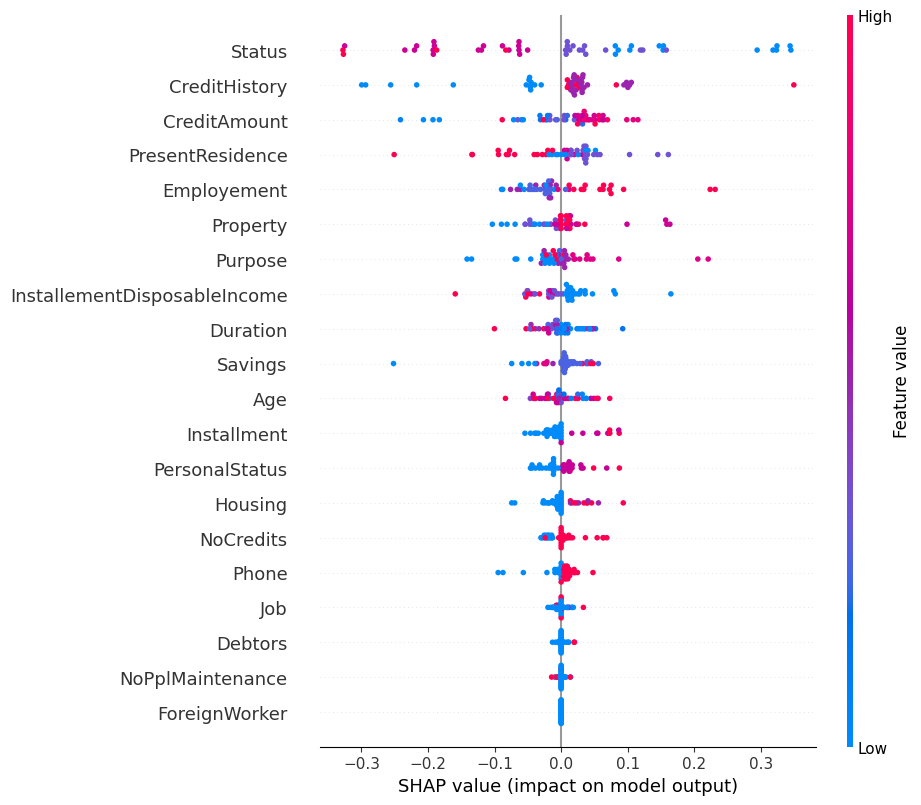

In [508]:
MODELS = [logr_model, xg_reg, rfc]
model_to_explain = rfc

shap_test = shap.sample(X_test, 50)
explainer = shap.KernelExplainer(rfc.predict, shap_test)
# explainer = shap.Explainer(xg_reg.predict, feature_names=X_train.columns)

shap_values = explainer.shap_values(shap_test)
shap.initjs()
shap.summary_plot(shap_values, shap_test)

In [417]:
shap.force_plot(
    explainer.expected_value, shap_values[0, :], np.array(X_test)[0, :],
    feature_names=X_test.columns
)

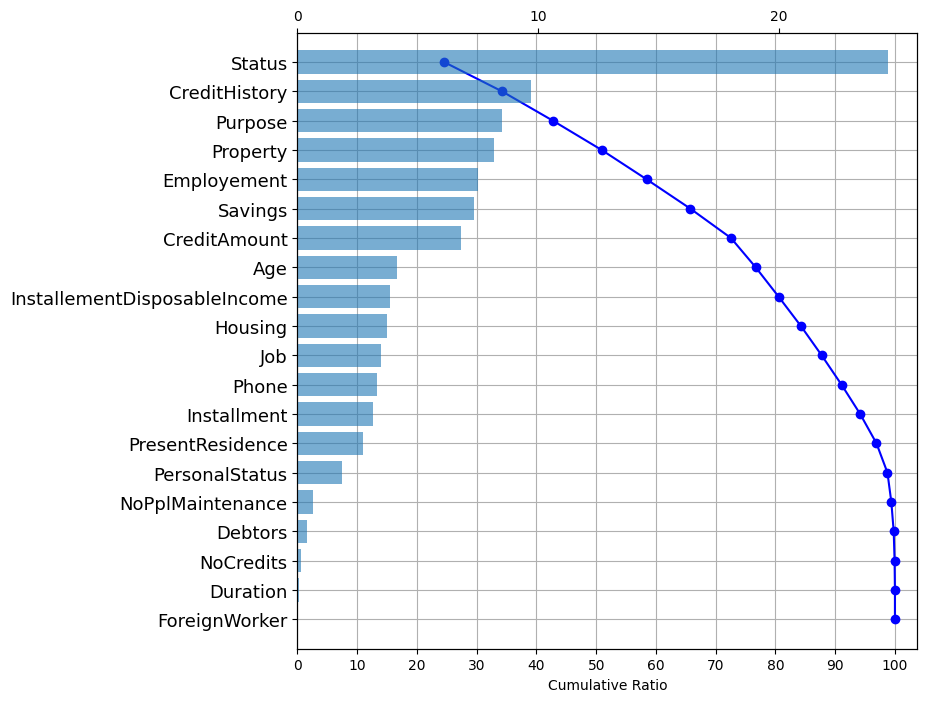

In [418]:
def make_shap_waterfall_plot(shap_values, features, num_display=20):
    column_list = features.columns
    feature_ratio = (np.abs(shap_values).sum(0) / np.abs(shap_values).sum()) * 100
    column_list = column_list[np.argsort(feature_ratio)[::-1]]
    feature_ratio_order = np.sort(feature_ratio)[::-1]
    cum_sum = np.cumsum(feature_ratio_order)
    column_list = column_list[:num_display]
    feature_ratio_order = feature_ratio_order[:num_display]
    cum_sum = cum_sum[:num_display]
    
    num_height = 0
    if (num_display >= 20) & (len(column_list) >= 20):
        num_height = (len(column_list) - 20) * 0.4
        
    fig, ax1 = plt.subplots(figsize=(8, 8 + num_height))
    ax1.plot(cum_sum[::-1], column_list[::-1], c='blue', marker='o')
    ax2 = ax1.twiny()
    ax2.barh(column_list[::-1], feature_ratio_order[::-1], alpha=0.6)
    
    ax1.grid(True)
    ax2.grid(False)
    ax1.set_xticks(np.arange(0, round(cum_sum.max(), -1)+1, 10))
    ax2.set_xticks(np.arange(0, round(feature_ratio_order.max(), -1)+1, 10))
    ax1.set_xlabel('Cumulative Ratio')
#     ax2.set_xlabel('Composition Ratio')
    ax1.tick_params(axis="y", labelsize=13)
    plt.ylim(-1, len(column_list))
    
    # Shap waterfall plot
make_shap_waterfall_plot(shap_values, X_test)
plt.show()

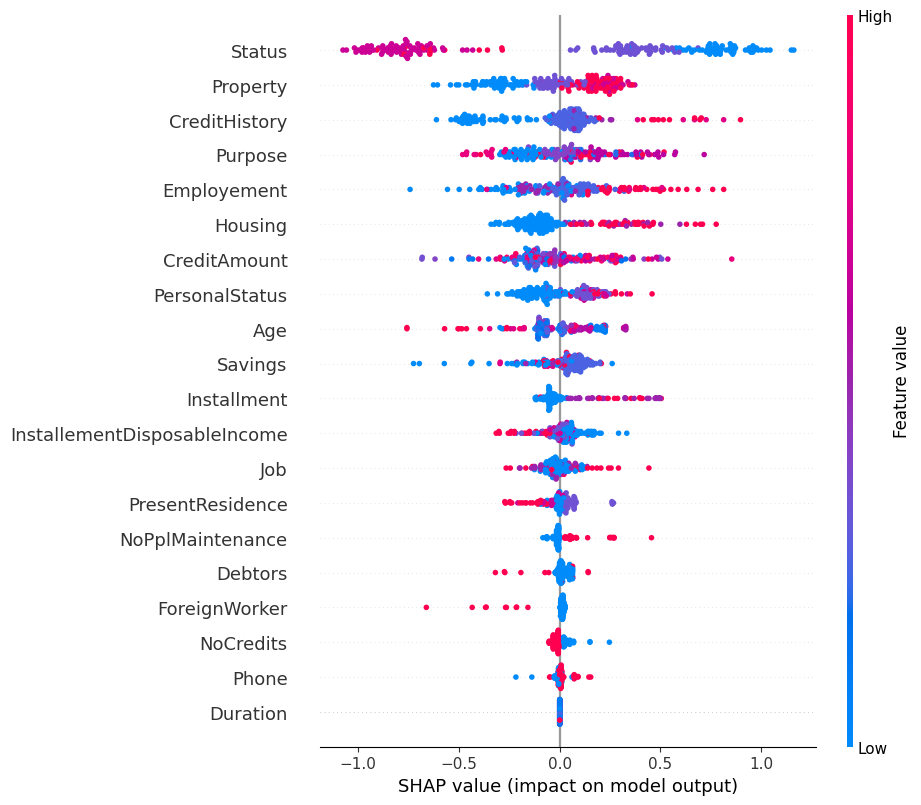

In [146]:

pred = xg_reg.predict(X_test, output_margin=True)
tree_explainer = shap.TreeExplainer(xg_reg)
tree_shap_values = tree_explainer.shap_values(X_test)
# np.abs(shap_values.sum(1) + explainer.expected_value - pred).max()

shap.summary_plot(tree_shap_values, X_test)

In [128]:
data_factorized.shape
feature_names = data_factorized.columns
print(len(feature_names))

21


In [129]:

# explainer = lime_tabular.LimeTabularExplainer(
#     training_data=np.array(X_train),
#     feature_names=X_train.columns,
#     class_names=['bad', 'good'],
#     mode='classification'
# )



# Implementation of LIME

In [419]:
import pprint 
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.to_numpy(),
    feature_names=feature_names,
#     categorical_features=qualitative_attributes_index,
    verbose=True,
    mode='classification'
)

print(X_test.shape)

clf = rfc # XGBoost

for ind in range(199):
    current_instance = X_test.to_numpy()[ind]
    px = clf.predict(np.array([current_instance]))
    print(f"instance {ind}, predict: {px}, actual: {Y_test.to_numpy()[ind]}")
#     if px[0] == 0:
#         continue
#     print(current_instance)
    exp = explainer.explain_instance(
#         data_row=X_test.to_numpy()[ind * 2],
        data_row=current_instance,
        predict_fn=clf.predict_proba,
        num_features=5,
    )
    elist = exp.as_list()
    pprint.pprint(elist[:5])

    exp.show_in_notebook(show_table=True)

(100, 20)
instance 0, predict: [0], actual: 1
Intercept 0.3645124426459375
Prediction_local [0.38776486]
Right: 0.37
[('Status <= 0.00', 0.1546654073080175),
 ('Installment <= 0.00', -0.07280300189254237),
 ('Property <= 0.00', -0.05375039255076979),
 ('Housing <= 0.00', -0.03786396000513727),
 ('438.50 < CreditAmount <= 675.50', 0.03300436713815008)]


instance 1, predict: [1], actual: 0
Intercept 0.33301809665503995
Prediction_local [0.44476394]
Right: 0.51
[('Status <= 0.00', 0.16042357014690162),
 ('Installment <= 0.00', -0.07835430819306904),
 ('Housing <= 0.00', -0.04922936160066532),
 ('1.00 < Property <= 3.00', 0.045366752824710824),
 ('CreditAmount > 675.50', 0.03353918811786112)]


instance 2, predict: [1], actual: 0
Intercept 0.24792134874981678
Prediction_local [0.58814155]
Right: 0.68
[('Status <= 0.00', 0.15810464778479816),
 ('CreditHistory > 1.00', 0.10172978334960463),
 ('Installment > 0.00', 0.07939541517378149),
 ('1.00 < Property <= 3.00', 0.044205178677152686),
 ('Housing <= 0.00', -0.043214820389195635)]


instance 3, predict: [0], actual: 0
Intercept 0.3880147492272217
Prediction_local [0.23838452]
Right: 0.1
[('Status > 2.00', -0.08592261237570777),
 ('Installment <= 0.00', -0.07500765356808904),
 ('Property <= 0.00', -0.05787746753931058),
 ('Housing > 1.00', 0.036299747098747115),
 ('PersonalStatus > 1.00', 0.03287775783279351)]


instance 4, predict: [0], actual: 0
Intercept 0.4838250227322145
Prediction_local [0.13447463]
Right: 0.09
[('1.00 < Status <= 2.00', -0.19404015591813095),
 ('CreditHistory <= 0.00', -0.07904112286311905),
 ('Installment <= 0.00', -0.07697355603958922),
 ('1.00 < Property <= 3.00', 0.04498871142261082),
 ('Housing <= 0.00', -0.044284270247158065)]


instance 5, predict: [1], actual: 0
Intercept 0.27707105053038
Prediction_local [0.48384893]
Right: 0.65
[('Status <= 0.00', 0.15279585832388495),
 ('Installment > 0.00', 0.08001112914000272),
 ('Housing > 1.00', 0.05613337250425369),
 ('Property <= 0.00', -0.052404330782374206),
 ('PersonalStatus <= 0.00', -0.029758144809193133)]


instance 6, predict: [0], actual: 0
Intercept 0.4527198564386111
Prediction_local [0.15525473]
Right: 0.11
[('Installment <= 0.00', -0.08204264509389526),
 ('Status > 2.00', -0.08102334278241782),
 ('Property <= 0.00', -0.0520641691772845),
 ('Housing <= 0.00', -0.05042575878989549),
 ('PersonalStatus <= 0.00', -0.031909212468294396)]


instance 7, predict: [1], actual: 0
Intercept 0.3313270485154068
Prediction_local [0.46452529]
Right: 0.55
[('CreditHistory > 1.00', 0.11038982555898878),
 ('0.00 < Status <= 1.00', 0.0889758138852796),
 ('Installment <= 0.00', -0.07410968809154285),
 ('Housing > 1.00', 0.05378470975957074),
 ('Property <= 0.00', -0.04584242277038196)]


instance 8, predict: [0], actual: 0
Intercept 0.4716470817865614
Prediction_local [0.16645861]
Right: 0.23
[('1.00 < Status <= 2.00', -0.18774910788518448),
 ('Installment <= 0.00', -0.07496381387018194),
 ('Property <= 0.00', -0.06231793617682545),
 ('Housing > 1.00', 0.04984640708844291),
 ('PersonalStatus <= 0.00', -0.030004019107677714)]


instance 9, predict: [0], actual: 0
Intercept 0.4421704354401921
Prediction_local [0.28144226]
Right: 0.07
[('1.00 < Status <= 2.00', -0.18754606459265682),
 ('CreditHistory > 1.00', 0.10337239291252089),
 ('Installment <= 0.00', -0.0769792713212099),
 ('1.00 < Property <= 3.00', 0.0463667225450266),
 ('Housing <= 0.00', -0.04594195442292066)]


instance 10, predict: [0], actual: 0


KeyboardInterrupt: 

In [484]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 900 entries, 716 to 102
Data columns (total 20 columns):
 #   Column                        Non-Null Count  Dtype
---  ------                        --------------  -----
 0   Status                        900 non-null    int64
 1   Duration                      900 non-null    int64
 2   CreditHistory                 900 non-null    int64
 3   Purpose                       900 non-null    int64
 4   CreditAmount                  900 non-null    int64
 5   Savings                       900 non-null    int64
 6   Employement                   900 non-null    int64
 7   InstallementDisposableIncome  900 non-null    int64
 8   PersonalStatus                900 non-null    int64
 9   Debtors                       900 non-null    int64
 10  PresentResidence              900 non-null    int64
 11  Property                      900 non-null    int64
 12  Age                           900 non-null    int64
 13  Installment                   900

In [439]:
import time
start = time.time()
for row in [10, 30, 50, 300]:
    exp = explainer.explain_instance(data_factorized.to_numpy()[row, : -1], xg_reg.predict, num_features=5)
#     exp.show_in_notebook(show_table=True)
    print("-"*100, end="\n")
print(f"Duration: {time.time() - start} seconds")

ValueError: operands could not be broadcast together with shapes (5000,20) (21,) 

# Run Anchors

In [520]:

# logr_model xg_reg rfc
def predict_func(x):
#     return xg_reg.predict(x)
    return xg_reg.predict(x)
#     return regression_model.predict(x)

In [521]:
feature_names = X_train.columns
feature_names = np.array(feature_names)
print(feature_names.shape)
print(feature_names.__class__)

achr_explainer = AnchorTabular(
    predict_func,  
    X_train.columns, 
#     categorical_names=category_map
)

(20,)
<class 'numpy.ndarray'>


In [522]:
achr_explainer.fit(np.array(X_train), disc_perc=[25, 50, 75])

AnchorTabular(meta={
  'name': 'AnchorTabular',
  'type': ['blackbox'],
  'explanations': ['local'],
  'params': {'seed': None, 'disc_perc': [25, 50, 75]},
  'version': '0.7.0'}
)

In [523]:
for idx in range(99): 
    achr_explanation = achr_explainer.explain(np.array(X_test)[idx], threshold=0.95)
    print(f"instance {idx}, true value: {Y_test.to_numpy()[idx]}, predict: {xg_reg.predict(np.array([X_test.to_numpy()[idx]]))}")
    print('Anchor: %s' % (' AND '.join(achr_explanation.anchor))) 
    print('Precision: %.2f' % achr_explanation.precision)
    print('Coverage: %.2f' % achr_explanation.coverage)


instance 0, true value: 1, predict: [0]
Anchor: Property <= 0.00 AND Purpose <= 0.00 AND InstallementDisposableIncome > 0.00
Precision: 0.96
Coverage: 0.05


Could not find an result satisfying the 0.95 precision constraint. Now returning the best non-eligible result.


instance 1, true value: 0, predict: [1]
Anchor: Status <= 0.00 AND 1.00 < Property <= 3.00 AND CreditHistory > 0.00 AND PresentResidence <= 0.00 AND Purpose > 2.00 AND CreditAmount > 438.50 AND ForeignWorker <= 0.00 AND InstallementDisposableIncome <= 2.00 AND Job <= 1.00 AND Installment <= 0.00 AND PersonalStatus <= 1.00 AND Age <= 28.00 AND Debtors <= 0.00 AND NoCredits <= 1.00 AND Duration > 5.00
Precision: 0.86
Coverage: 0.00
instance 2, true value: 0, predict: [1]
Anchor: Status <= 0.00 AND CreditHistory > 1.00 AND Property > 1.00 AND 2.00 < Purpose <= 4.00 AND InstallementDisposableIncome <= 1.00 AND CreditAmount > 438.50 AND Duration <= 9.00 AND PersonalStatus <= 1.00 AND NoPplMaintenance <= 0.00 AND Age <= 28.00
Precision: 0.96
Coverage: 0.00
instance 3, true value: 0, predict: [0]
Anchor: Status > 1.00 AND Property <= 3.00
Precision: 0.96
Coverage: 0.46
instance 4, true value: 0, predict: [0]
Anchor: Status > 1.00
Precision: 0.97
Coverage: 0.46
instance 5, true value: 0, predi

Could not find an result satisfying the 0.95 precision constraint. Now returning the best non-eligible result.


instance 27, true value: 0, predict: [1]
Anchor: CreditHistory > 1.00 AND Employement > 2.00 AND 0.00 < Property <= 3.00 AND Age <= 28.00 AND Purpose > 4.00 AND PersonalStatus > 1.00 AND CreditAmount > 675.50 AND 0.00 < Phone <= 1.00 AND NoCredits <= 0.00 AND Status > 2.00 AND InstallementDisposableIncome <= 1.00 AND ForeignWorker <= 0.00 AND Job <= 0.00 AND Housing <= 0.00 AND Duration <= 5.00 AND NoPplMaintenance <= 0.00 AND Installment <= 0.00 AND Debtors <= 0.00
Precision: 0.87
Coverage: 0.00
instance 28, true value: 0, predict: [0]
Anchor: Status > 1.00
Precision: 0.96
Coverage: 0.46
instance 29, true value: 0, predict: [0]
Anchor: Status > 1.00
Precision: 0.97
Coverage: 0.46
instance 30, true value: 0, predict: [0]
Anchor: CreditHistory <= 0.00 AND Property <= 0.00
Precision: 0.98
Coverage: 0.09
instance 31, true value: 0, predict: [0]
Anchor: Status > 1.00 AND Property <= 3.00
Precision: 0.97
Coverage: 0.46
instance 32, true value: 1, predict: [0]
Anchor: Status > 1.00
Precision

Could not find an result satisfying the 0.95 precision constraint. Now returning the best non-eligible result.


instance 57, true value: 1, predict: [1]
Anchor: Status <= 1.00 AND Housing > 0.00 AND CreditHistory > 0.00 AND Property > 1.00 AND Phone > 0.00 AND 2.00 < Purpose <= 4.00 AND Duration <= 2.00 AND InstallementDisposableIncome <= 2.00 AND Age <= 19.00 AND ForeignWorker <= 0.00 AND PersonalStatus > 0.00 AND NoPplMaintenance <= 0.00 AND Job <= 1.00 AND Employement > 2.00 AND NoCredits <= 1.00 AND Savings <= 1.00 AND Installment <= 0.00
Precision: 0.95
Coverage: 0.00
instance 58, true value: 0, predict: [1]
Anchor: Status <= 0.00 AND Installment > 0.00 AND CreditHistory > 0.00 AND Housing > 1.00 AND InstallementDisposableIncome <= 0.00 AND Property > 0.00 AND 0.00 < Employement <= 1.00
Precision: 1.00
Coverage: 0.00
instance 59, true value: 0, predict: [0]
Anchor: Status > 1.00 AND Employement <= 1.00
Precision: 0.99
Coverage: 0.30
instance 60, true value: 0, predict: [0]
Anchor: Status > 1.00
Precision: 0.97
Coverage: 0.46
instance 61, true value: 1, predict: [1]
Anchor: CreditHistory > 1

Could not find an result satisfying the 0.95 precision constraint. Now returning the best non-eligible result.


instance 73, true value: 0, predict: [1]
Anchor: Status <= 1.00 AND CreditHistory > 1.00 AND Installment > 0.00 AND InstallementDisposableIncome <= 0.00 AND 0.00 < Phone <= 1.00 AND Purpose <= 2.00 AND CreditAmount > 438.50 AND Job <= 1.00 AND Debtors <= 0.00 AND NoCredits > 0.00 AND Employement > 0.00 AND PersonalStatus <= 1.00 AND NoPplMaintenance <= 0.00 AND ForeignWorker <= 0.00 AND Duration > 2.00 AND PresentResidence <= 2.00 AND 10.75 < Age <= 28.00 AND Property <= 3.00
Precision: 0.91
Coverage: 0.00
instance 74, true value: 0, predict: [0]
Anchor: CreditHistory <= 0.00 AND InstallementDisposableIncome > 0.00 AND Age > 10.75
Precision: 0.95
Coverage: 0.11
instance 75, true value: 1, predict: [1]
Anchor: Status <= 0.00 AND CreditHistory > 1.00 AND Employement > 2.00 AND PersonalStatus > 0.00 AND Savings <= 1.00 AND Debtors <= 0.00 AND InstallementDisposableIncome <= 0.00 AND Job <= 0.00 AND CreditAmount <= 675.50
Precision: 0.96
Coverage: 0.00


Could not find an result satisfying the 0.95 precision constraint. Now returning the best non-eligible result.


instance 76, true value: 1, predict: [1]
Anchor: Status <= 0.00 AND CreditHistory > 0.00 AND InstallementDisposableIncome <= 0.00 AND 2.00 < Purpose <= 4.00 AND 438.50 < CreditAmount <= 675.50 AND Job <= 0.00 AND NoPplMaintenance <= 0.00 AND ForeignWorker <= 0.00 AND Savings <= 1.00 AND 2.00 < Duration <= 5.00 AND 0.00 < NoCredits <= 1.00 AND 0.00 < Phone <= 1.00 AND Property <= 3.00 AND Age <= 28.00
Precision: 0.89
Coverage: 0.00
instance 77, true value: 0, predict: [0]
Anchor: Status > 0.00 AND Property <= 0.00 AND Age <= 19.00
Precision: 0.99
Coverage: 0.11
instance 78, true value: 1, predict: [0]
Anchor: CreditHistory <= 0.00 AND Property <= 1.00
Precision: 0.96
Coverage: 0.16
instance 79, true value: 1, predict: [1]
Anchor: Status <= 0.00 AND Property > 1.00 AND Employement > 2.00 AND CreditHistory > 0.00 AND InstallementDisposableIncome <= 0.00 AND 217.75 < CreditAmount <= 675.50 AND PersonalStatus > 0.00 AND Age <= 28.00 AND Debtors <= 0.00 AND Purpose <= 4.00 AND ForeignWorker 

Could not find an result satisfying the 0.95 precision constraint. Now returning the best non-eligible result.


instance 87, true value: 1, predict: [1]
Anchor: Status <= 1.00 AND Property > 1.00 AND CreditHistory > 0.00 AND InstallementDisposableIncome <= 0.00 AND CreditAmount > 438.50 AND 1.00 < Employement <= 2.00 AND PresentResidence <= 1.00 AND Purpose <= 4.00 AND Debtors <= 0.00 AND Installment <= 0.00 AND ForeignWorker <= 0.00 AND Age <= 28.00 AND NoPplMaintenance <= 0.00 AND PersonalStatus <= 1.00 AND NoCredits > 0.00 AND Duration > 9.00
Precision: 0.91
Coverage: 0.00
instance 88, true value: 0, predict: [0]
Anchor: Status > 1.00 AND CreditHistory <= 0.00
Precision: 0.99
Coverage: 0.17
instance 89, true value: 0, predict: [0]
Anchor: Status > 1.00
Precision: 0.97
Coverage: 0.46
instance 90, true value: 0, predict: [0]
Anchor: Status > 1.00 AND Employement <= 2.00
Precision: 0.97
Coverage: 0.38
instance 91, true value: 0, predict: [0]
Anchor: Status > 1.00 AND CreditAmount <= 438.50
Precision: 0.99
Coverage: 0.23
instance 92, true value: 1, predict: [1]
Anchor: Status <= 0.00 AND CreditHi

In [573]:
# Y = data_factorized["credit"]
# X = data_factorized.drop("credit", axis=1)
df = original_df.copy()
data_factorized = df.apply(lambda x : pd.factorize(x)[0])
Y = data_factorized["credit"]
X = data_factorized.drop("credit", axis=1)


# X = df.drop("credit", axis=1)
# Y = df["credit"]

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2)
# print(df["credit"].describe())
print(Y_train.shape)
print(X_train[:5])

(800,)
     month  credit_amount  investment_as_income_percentage  residence_since  \
484      2            467                                0                0   
102      0            100                                2                1   
668      2            635                                2                0   
614     12            585                                0                3   
611      9            133                                3                0   

     age  number_of_credits  people_liable_for  status=A11  status=A12  \
484    0                  1                  0           1           0   
102    1                  1                  0           1           0   
668    0                  0                  0           0           0   
614    1                  1                  0           1           0   
611    0                  1                  1           1           0   

     status=A13  ...  housing=A152  housing=A153  skill_level=A171  \
484

In [130]:
# lr = LinearRegression()
# lr_model = lr.fit(X_train, Y_train)

In [129]:
# lr_y_pred = lr_model.predict(X_test)
# print(confusion_matrix(Y_test, lr_y_pred))
# print(lr_y_pred)

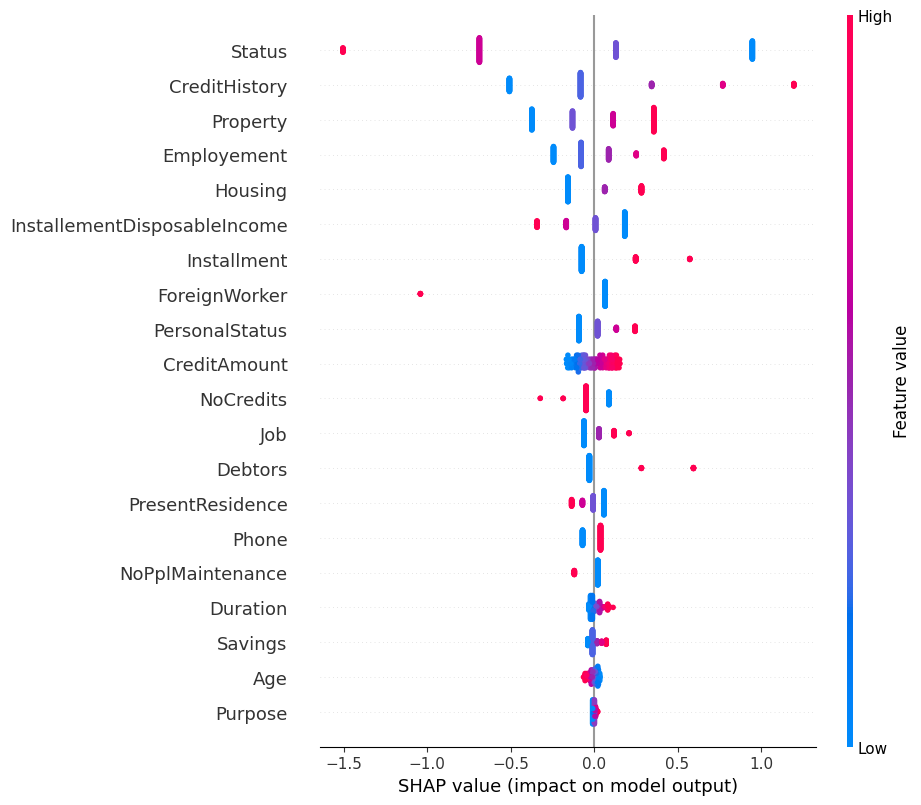

In [131]:
explainer = shap.LinearExplainer(logr_model, X_test)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

# Interpretations:
- From top to bottom features importance decrease. (Foreign Workers and Age matter the most in this case)
- Horizontal shows if the effect of the value is associated with the predition with a higher or lower value.


In [342]:
# shap.initjs()
shap.force_plot(
    explainer.expected_value, shap_values[0, :], np.array(X_test)[0, :],
    feature_names=X_test.columns
)


In [101]:
xgbr = XGBRegressor()
feature_names = X_train.columns
scaler = StandardScaler()
train_X_scaled = scaler.fit_transform(X_train)
test_X_scaled = scaler.fit_transform(X_test)
test_X_mean = scaler.mean_


In [93]:
xgbr_model = xgbr.fit(train_X_scaled, Y_train)

In [94]:
est = xgbr_model.predict(test_X_scaled)

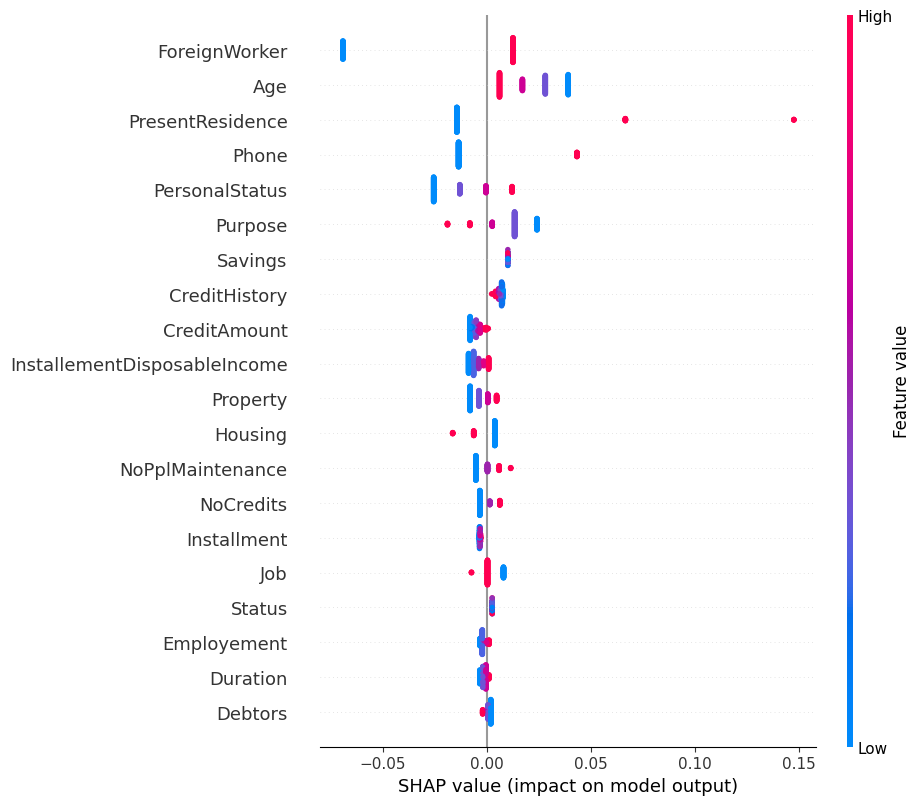

In [102]:
explaier = shap.TreeExplainer(xgbr_model,test_X_scaled)
shap_values = explainer.shap_values(test_X_scaled)
shap.summary_plot(shap_values, test_X_scaled, feature_names=feature_names)

In [590]:
rfc = RandomForestClassifier()
rfc_model = rfc.fit(X_train, Y_train)

In [591]:
y_pred = rfc_model.predict(X_test)
print(classification_report(Y_test,y_pred))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98       192
           1       0.00      0.00      0.00         8

    accuracy                           0.96       200
   macro avg       0.48      0.50      0.49       200
weighted avg       0.92      0.96      0.94       200



Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


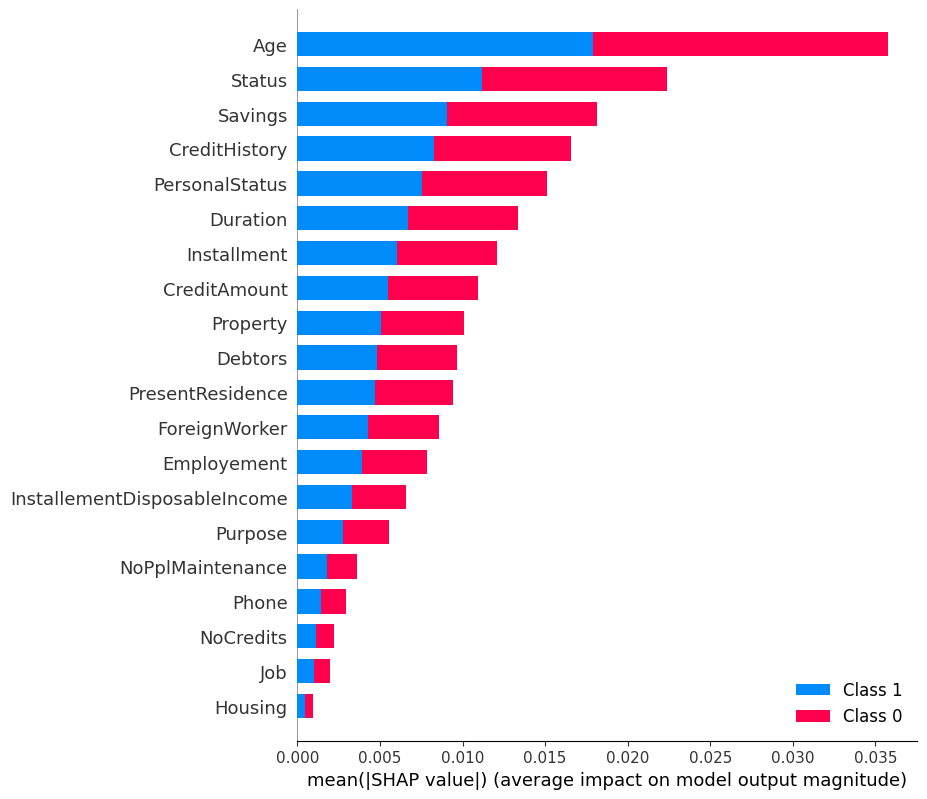

In [592]:
explainer = shap.TreeExplainer(rfc_model,X_test)
shap_values = explainer.shap_values(X_test)
shap.initjs()
shap.summary_plot(shap_values, X_test)

In [132]:
logr = LogisticRegression(max_iter=100000)

logr_model = logr.fit(X_train, Y_train)

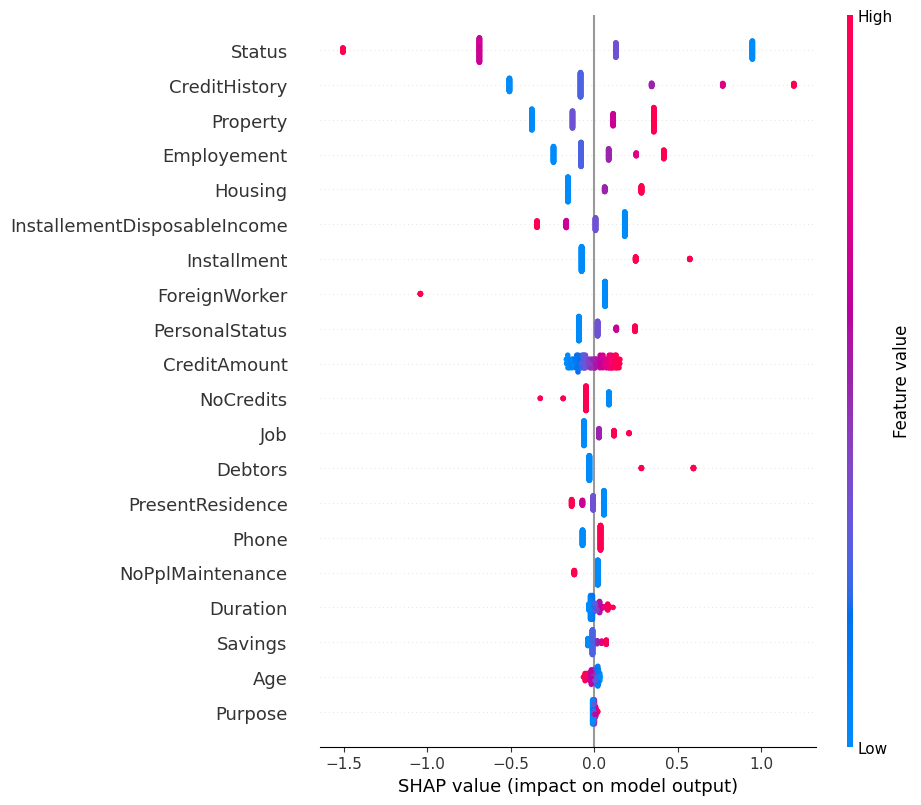

In [133]:
explainer = shap.LinearExplainer(logr_model,X_test)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

In [595]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   const                         1000 non-null   float64
 1   Status                        1000 non-null   int64  
 2   Duration                      1000 non-null   int64  
 3   CreditHistory                 1000 non-null   int64  
 4   Purpose                       1000 non-null   int64  
 5   CreditAmount                  1000 non-null   int64  
 6   Savings                       1000 non-null   int64  
 7   Employement                   1000 non-null   int64  
 8   InstallementDisposableIncome  1000 non-null   int64  
 9   PersonalStatus                1000 non-null   int64  
 10  Debtors                       1000 non-null   int64  
 11  PresentResidence              1000 non-null   int64  
 12  Property                      1000 non-null   int64  
 13  Age 

In [510]:
print("""
instance 53, true value: 1, predict: [0]
Anchor: Status > 0.00 AND CreditHistory <= 0.00 AND Installment <= 0.00 AND Age > 10.75
Precision: 0.96
Coverage: 0.15
""")
print("""
instance 73, true value: 0, predict: [1]
Anchor: Status <= 1.00 AND CreditHistory > 1.00 AND InstallementDisposableIncome <= 0.00 AND CreditAmount > 438.50 AND Installment > 0.00 AND Phone > 0.00 AND PresentResidence <= 0.00 AND 19.00 < Age <= 28.00 AND 0.00 < NoCredits <= 1.00 AND Employement > 0.00 AND Savings <= 1.00 AND Property <= 1.00 AND Debtors <= 0.00 AND ForeignWorker <= 0.00 AND Duration <= 9.00 AND Purpose <= 4.00 AND Job <= 1.00
Precision: 0.89
Coverage: 0.00
""")


instance 53, true value: 1, predict: [0]
Anchor: Status > 0.00 AND CreditHistory <= 0.00 AND Installment <= 0.00 AND Age > 10.75
Precision: 0.96
Coverage: 0.15


instance 73, true value: 0, predict: [1]
Anchor: Status <= 1.00 AND CreditHistory > 1.00 AND InstallementDisposableIncome <= 0.00 AND CreditAmount > 438.50 AND Installment > 0.00 AND Phone > 0.00 AND PresentResidence <= 0.00 AND 19.00 < Age <= 28.00 AND 0.00 < NoCredits <= 1.00 AND Employement > 0.00 AND Savings <= 1.00 AND Property <= 1.00 AND Debtors <= 0.00 AND ForeignWorker <= 0.00 AND Duration <= 9.00 AND Purpose <= 4.00 AND Job <= 1.00
Precision: 0.89
Coverage: 0.00



In [514]:
print("""
Anchor: CreditHistory <= 0.00 AND Property <= 0.00 AND PersonalStatus <= 0.00 AND Installment <= 0.00
Precision: 0.96
Coverage: 0.06
Anchor: Status > 0.00 AND CreditHistory <= 1.00 AND PersonalStatus <= 0.00 AND Installment <= 0.00 AND Job <= 1.00 AND PresentResidence > 2.00
Precision: 0.97
Coverage: 0.03
""")


Anchor: CreditHistory <= 0.00 AND Property <= 0.00 AND PersonalStatus <= 0.00 AND Installment <= 0.00
Precision: 0.96
Coverage: 0.06
Anchor: Status > 0.00 AND CreditHistory <= 1.00 AND PersonalStatus <= 0.00 AND Installment <= 0.00 AND Job <= 1.00 AND PresentResidence > 2.00
Precision: 0.97
Coverage: 0.03



In [524]:
print("""instance 79, true value: 1, predict: [1]
Anchor: Status <= 0.00 AND Property > 1.00 AND Employement > 2.00 AND CreditHistory > 0.00 AND InstallementDisposableIncome <= 0.00 AND 217.75 < CreditAmount <= 675.50 AND PersonalStatus > 0.00 AND Age <= 28.00 AND Debtors <= 0.00 AND Purpose <= 4.00 AND ForeignWorker <= 0.00
Precision: 0.95
Coverage: 0.01
instance 39, true value: 1, predict: [0]
Anchor: CreditHistory <= 0.00 AND Phone <= 0.00 AND Age > 19.00
Precision: 0.97
Coverage: 0.07


""")

instance 79, true value: 1, predict: [1]
Anchor: Status <= 0.00 AND Property > 1.00 AND Employement > 2.00 AND CreditHistory > 0.00 AND InstallementDisposableIncome <= 0.00 AND 217.75 < CreditAmount <= 675.50 AND PersonalStatus > 0.00 AND Age <= 28.00 AND Debtors <= 0.00 AND Purpose <= 4.00 AND ForeignWorker <= 0.00
Precision: 0.95
Coverage: 0.01
instance 39, true value: 1, predict: [0]
Anchor: CreditHistory <= 0.00 AND Phone <= 0.00 AND Age > 19.00
Precision: 0.97
Coverage: 0.07



